##### Copyright 2019 The TensorFlow Authors.

In [48]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# CycleGAN

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/cyclegan"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/cyclegan.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/cyclegan.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/cyclegan.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This notebook demonstrates unpaired image to image translation using conditional GAN's, as described in [Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks](https://arxiv.org/abs/1703.10593), also known as CycleGAN. The paper proposes a method that can capture the characteristics of one image domain and figure out how these characteristics could be translated into another image domain, all in the absence of any paired training examples. 

This notebook assumes you are familiar with Pix2Pix, which you can learn about in the [Pix2Pix tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix). The code for CycleGAN is similar, the main difference is an additional loss function, and the use of unpaired training data.

CycleGAN uses a cycle consistency loss to enable training without the need for paired data. In other words, it can translate from one domain to another without a one-to-one mapping between the source and target domain. 

This opens up the possibility to do a lot of interesting tasks like photo-enhancement, image colorization, style transfer, etc. All you need is the source and the target dataset (which is simply a directory of images).

![Output Image 1](images/horse2zebra_1.png)
![Output Image 2](images/horse2zebra_2.png)

## Set up the input pipeline

Install the [tensorflow_examples](https://github.com/tensorflow/examples) package that enables importing of the generator and the discriminator.

In [2]:
!pip install -q git+https://github.com/tensorflow/examples.git

You should consider upgrading via the 'pip install --upgrade pip' command.


In [1]:
import tensorflow as tf
tf.__version__

'2.0.0'

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

tfds.disable_progress_bar()
AUTOTUNE = tf.data.experimental.AUTOTUNE

## Important: Sets up TF to not run out of GPU memory

In [3]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
# config.gpu_options.per_process_gpu_memory_fraction=0.5
session = InteractiveSession(config=config)

## Input Pipeline

This tutorial trains a model to translate from images of horses, to images of zebras. You can find this dataset and similar ones [here](https://www.tensorflow.org/datasets/datasets#cycle_gan). 

As mentioned in the [paper](https://arxiv.org/abs/1703.10593), apply random jittering and mirroring to the training dataset. These are some of the image augmentation techniques that avoids overfitting.

This is similar to what was done in [pix2pix](https://www.tensorflow.org/tutorials/generative/pix2pix#load_the_dataset)

* In random jittering, the image is resized to `286 x 286` and then randomly cropped to `256 x 256`.
* In random mirroring, the image is randomly flipped horizontally i.e left to right.

In [4]:
# dataset, metadata = tfds.load('cycle_gan/horse2zebra',
#                               with_info=True, as_supervised=True)

# train_horses, train_zebras = dataset['trainA'], dataset['trainB']
# test_horses, test_zebras = dataset['testA'], dataset['testB']

In [5]:
PATH = "./input/cycletrain/"


def load_pair(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, :w, :]
  input_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

In [6]:
def load_single(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)
    image = tf.cast(image, tf.float32)
    return image

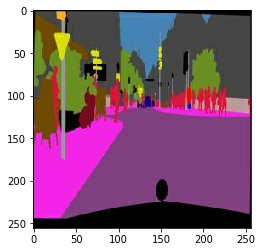

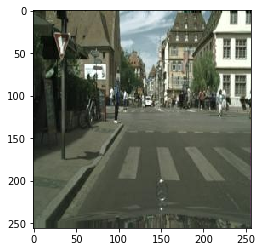

In [7]:
inp, re = load_pair(PATH+'train/2222.jpg')

# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

In [8]:
BUFFER_SIZE = 100
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [9]:
def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image

In [10]:
# normalizing the images to [-1, 1]
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

In [11]:
def random_jitter(image):
  # resizing to 286 x 286 x 3
  image = tf.image.resize(image, [286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  # randomly cropping to 256 x 256 x 3
  image = random_crop(image)

  # random mirroring
  image = tf.image.random_flip_left_right(image)

  return image

In [12]:
def preprocess_image_train(image, label=None):
  image = random_jitter(image)
  image = normalize(image)
  return image

In [13]:
def preprocess_image_test(image, label=None):
  image = normalize(image)
  return image

In [14]:
def load_image_train(image_path):
    image = load_single(image_path)
    return preprocess_image_train(image)

In [36]:
def load_image_test(image_path):
    image = load_single(image_path)
    return preprocess_image_test(image)

In [39]:
train_real_paths = tf.data.Dataset.list_files(PATH+'train_real/*.jpg')
train_mask_paths = tf.data.Dataset.list_files(PATH+'train_mask/*.jpg')
test_real_paths = tf.data.Dataset.list_files(PATH+'test_real/*.jpg')
test_mask_paths = tf.data.Dataset.list_files(PATH+'test_mask/*.jpg')

train_reals= train_real_paths.map(load_image_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE) \
                          .shuffle(BUFFER_SIZE) \
                          .batch(BATCH_SIZE)

test_reals= test_real_paths.map(load_image_test,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE) \
                          .shuffle(BUFFER_SIZE) \
                          .batch(BATCH_SIZE)


train_masks = train_mask_paths.map(
    load_image_train, num_parallel_calls=AUTOTUNE)\
.shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_masks = test_mask_paths.map(
    load_image_test, num_parallel_calls=AUTOTUNE)\
.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# USE LOCAL COPIES FOR THE REST train/test AS WELL #############
## There's probably something in tf_datasets that loads the entire data into memory or something

In [18]:
# train_horses = train_horses.map(
#     preprocess_image_train, num_parallel_calls=AUTOTUNE).cache().shuffle(
#     BUFFER_SIZE).batch(1)

# train_zebras = train_zebras.map(
#     preprocess_image_train, num_parallel_calls=AUTOTUNE).cache().shuffle(
#     BUFFER_SIZE).batch(1)

# test_horses = test_horses.map(
#     preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(
#     BUFFER_SIZE).batch(1)

# test_zebras = test_zebras.map(
#     preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(
#     BUFFER_SIZE).batch(1)

In [16]:
sample_real = next(iter(train_reals))
sample_mask = next(iter(train_masks))

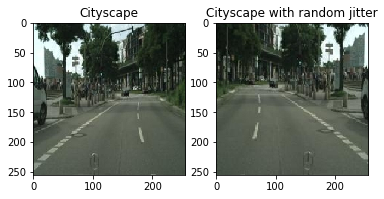

In [17]:
plt.subplot(121)
plt.title('Cityscape')
plt.imshow(sample_real[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Cityscape with random jitter')
plt.imshow(random_jitter(sample_real[0]) * 0.5 + 0.5)

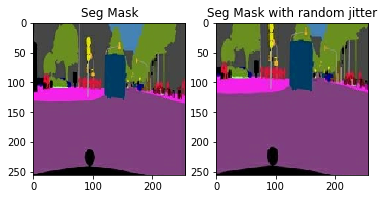

In [18]:
plt.subplot(121)
plt.title('Seg Mask')
plt.imshow(sample_mask[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Seg Mask with random jitter')
plt.imshow(random_jitter(sample_mask[0]) * 0.5 + 0.5)

## Import and reuse the Pix2Pix models

Import the generator and the discriminator used in [Pix2Pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py) via the installed [tensorflow_examples](https://github.com/tensorflow/examples) package.

The model architecture used in this tutorial is very similar to what was used in [pix2pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py). Some of the differences are:

* Cyclegan uses [instance normalization](https://arxiv.org/abs/1607.08022) instead of [batch normalization](https://arxiv.org/abs/1502.03167).
* The [CycleGAN paper](https://arxiv.org/abs/1703.10593) uses a modified `resnet` based generator. This tutorial is using a modified `unet` generator for simplicity.

There are 2 generators (G and F) and 2 discriminators (X and Y) being trained here. 

* Generator `G` learns to transform image `X` to image `Y`. $(G: X -> Y)$
* Generator `F` learns to transform image `Y` to image `X`. $(F: Y -> X)$
* Discriminator `D_X` learns to differentiate between image `X` and generated image `X` (`F(Y)`).
* Discriminator `D_Y` learns to differentiate between image `Y` and generated image `Y` (`G(X)`).

![Cyclegan model](images/cyclegan_model.png)

In [19]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

In [20]:
# discriminator_x.summary()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


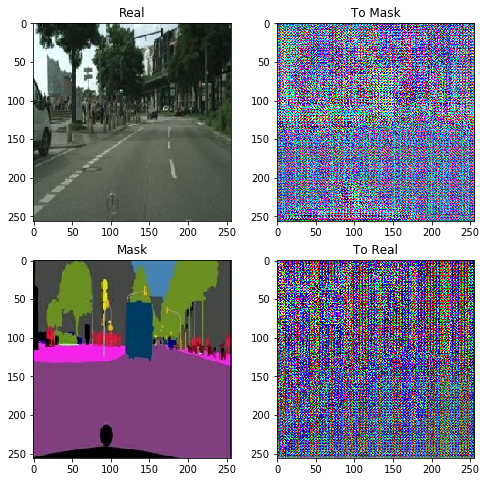

In [21]:
to_zebra = generator_g(sample_mask)
to_horse = generator_f(sample_real)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_real, to_zebra, sample_mask, to_horse]
title = ['Real', 'To Mask', 'Mask', 'To Real']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

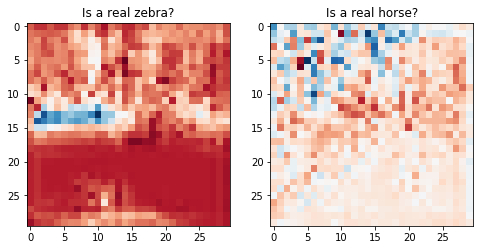

In [22]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real zebra?')
plt.imshow(discriminator_y(sample_mask)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real horse?')
plt.imshow(discriminator_x(sample_real)[0, ..., -1], cmap='RdBu_r')

plt.show()

## Loss functions

In CycleGAN, there is no paired data to train on, hence there is no guarantee that the input `x` and the target `y` pair are meaningful during training. Thus in order to enforce that the network learns the correct mapping, the authors propose the cycle consistency loss.

The discriminator loss and the generator loss are similar to the ones used in [pix2pix](https://www.tensorflow.org/tutorials/generative/pix2pix#define_the_loss_functions_and_the_optimizer).

In [23]:
LAMBDA = 10

In [24]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [25]:
def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [26]:
def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

Cycle consistency means the result should be close to the original input. For example, if one translates a sentence from English to French, and then translates it back from French to English, then the resulting sentence should be the same as the  original sentence.

In cycle consistency loss, 

* Image $X$ is passed via generator $G$ that yields generated image $\hat{Y}$.
* Generated image $\hat{Y}$ is passed via generator $F$ that yields cycled image $\hat{X}$.
* Mean absolute error is calculated between $X$ and $\hat{X}$.

$$forward\ cycle\ consistency\ loss: X -> G(X) -> F(G(X)) \sim \hat{X}$$

$$backward\ cycle\ consistency\ loss: Y -> F(Y) -> G(F(Y)) \sim \hat{Y}$$


![Cycle loss](images/cycle_loss.png)

In [27]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  
  return LAMBDA * loss1

As shown above, generator $G$ is responsible for translating image $X$ to image $Y$. Identity loss says that, if you fed image $Y$ to generator $G$, it should yield the real image $Y$ or something close to image $Y$.

$$Identity\ loss = |G(Y) - Y| + |F(X) - X|$$

In [28]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

Initialize the optimizers for all the generators and the discriminators.

In [29]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Checkpoints

In [97]:
checkpoint_path = "./checkpoints_cyclegan/train"

unsupervised_ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

unsupervised_ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=None)

# if a checkpoint exists, restore the latest checkpoint.
if unsupervised_ckpt_manager.latest_checkpoint:
    print("Found:", unsupervised_ckpt_manager.latest_checkpoint)
    unsupervised_ckpt.restore(unsupervised_ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

Found: ./checkpoints_cyclegan/train/ckpt-6
Latest checkpoint restored!!


In [31]:
!ls {checkpoint_path}

checkpoint		    ckpt-4.data-00000-of-00002
ckpt-1.data-00000-of-00002  ckpt-4.data-00001-of-00002
ckpt-1.data-00001-of-00002  ckpt-4.index
ckpt-1.index		    ckpt-5.data-00000-of-00002
ckpt-2.data-00000-of-00002  ckpt-5.data-00001-of-00002
ckpt-2.data-00001-of-00002  ckpt-5.index
ckpt-2.index		    ckpt-6.data-00000-of-00002
ckpt-3.data-00000-of-00002  ckpt-6.data-00001-of-00002
ckpt-3.data-00001-of-00002  ckpt-6.index
ckpt-3.index


In [32]:
ckpt_manager.latest_checkpoint

'./checkpoints_cyclegan/train/ckpt-6'

## Training

Note: This example model is trained for fewer epochs (40) than the paper (200) to keep training time reasonable for this tutorial. Predictions may be less accurate. 

#### STARTING FROM CHECKPOINT 3 : Epoch 15
> Epoch 15 + 15 was pretty good

> 75 was terrible

>Waiting on 100...

In [33]:
EPOCHS = 30

In [34]:
def generate_images(model, test_input):
  prediction = model(test_input)
    
  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Even though the training loop looks complicated, it consists of four basic steps:

* Get the predictions.
* Calculate the loss.
* Calculate the gradients using backpropagation.
* Apply the gradients to the optimizer.

In [44]:
@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.
    
    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)
    
    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
    
    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
  
  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables)
  
  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)
  
  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))
  
  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))
  
  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

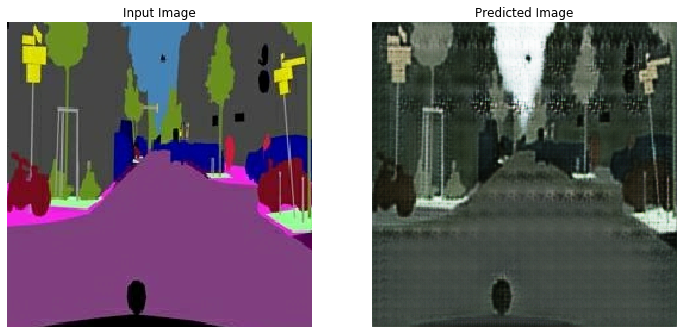

Time taken for epoch 1 is 1050.9724040031433 sec


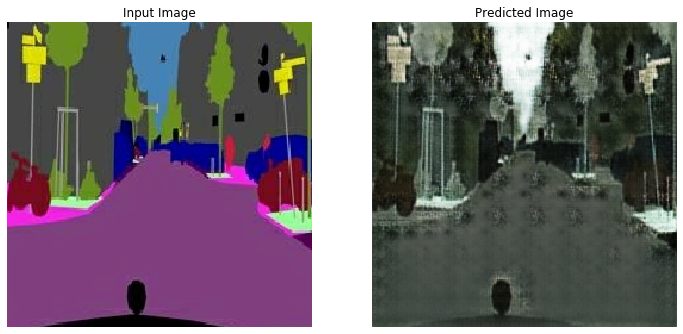

Time taken for epoch 2 is 998.7497267723083 sec


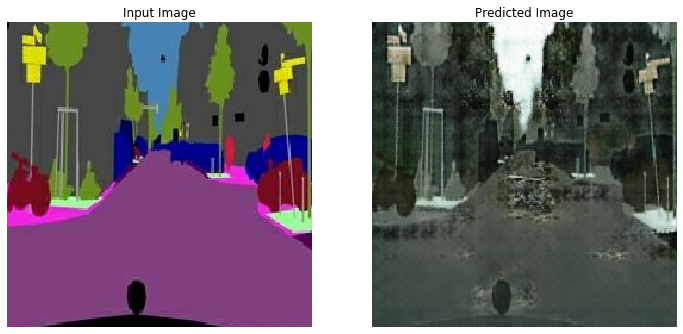

Time taken for epoch 3 is 998.214478969574 sec


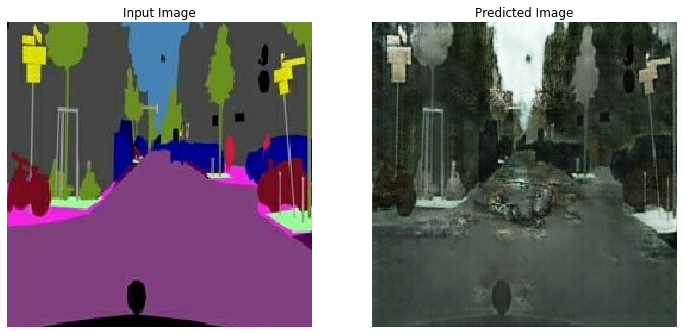

Time taken for epoch 4 is 998.290135383606 sec


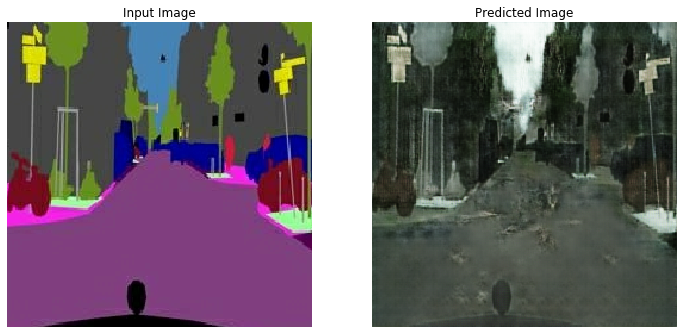

Saving checkpoint for epoch 5 at ./checkpoints_cyclegan/train/ckpt-1
Time taken for epoch 5 is 999.9376132488251 sec


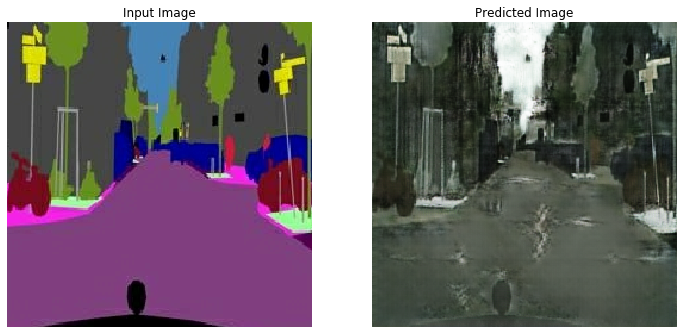

Time taken for epoch 6 is 998.3922429084778 sec


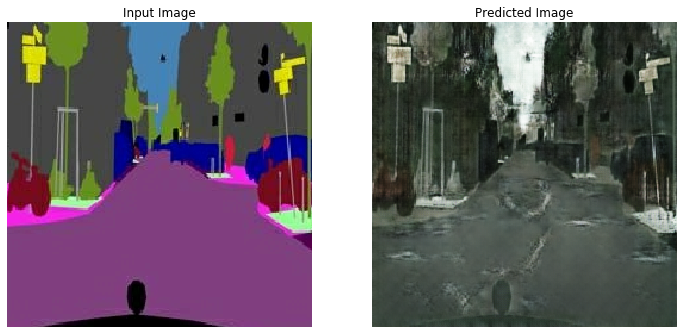

Time taken for epoch 7 is 998.7352471351624 sec


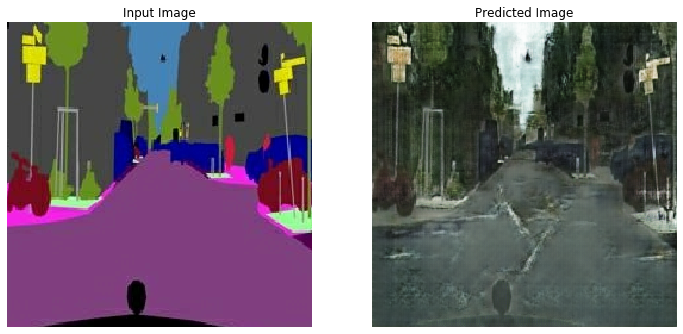

Time taken for epoch 8 is 998.3448686599731 sec


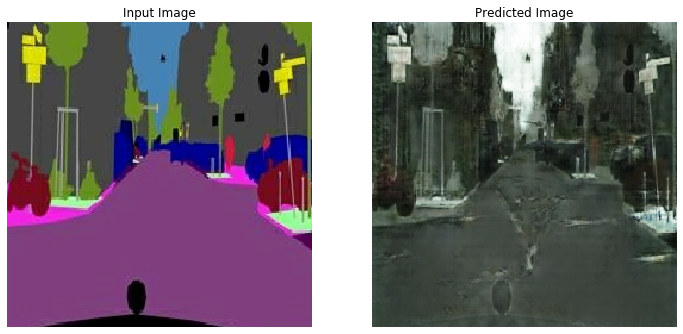

Time taken for epoch 9 is 998.5554084777832 sec


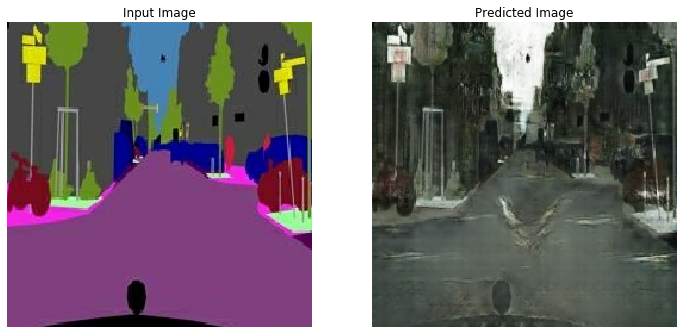

Saving checkpoint for epoch 10 at ./checkpoints_cyclegan/train/ckpt-2
Time taken for epoch 10 is 999.9858434200287 sec


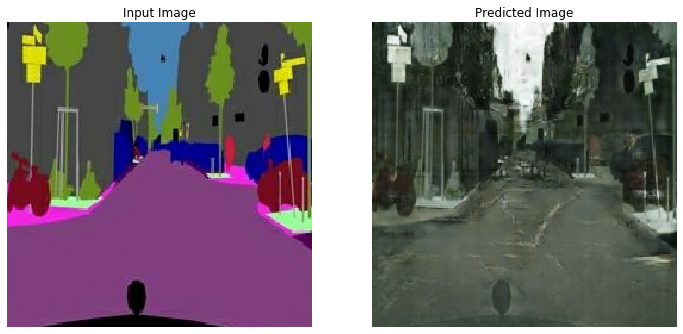

Time taken for epoch 11 is 998.3006279468536 sec


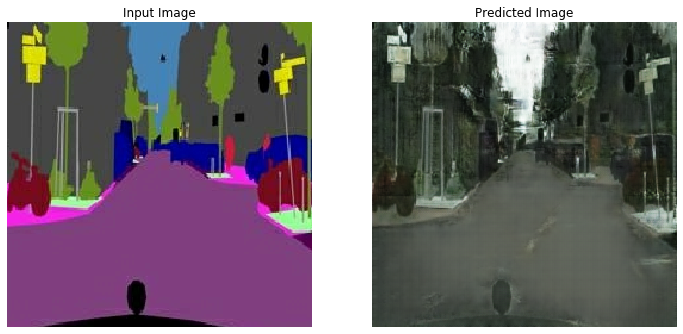

Time taken for epoch 12 is 998.0687401294708 sec


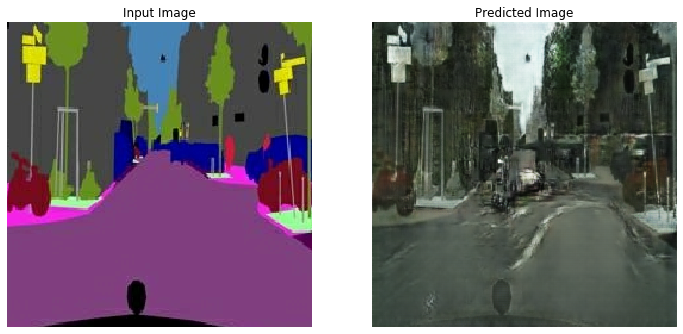

Time taken for epoch 13 is 998.4505777359009 sec


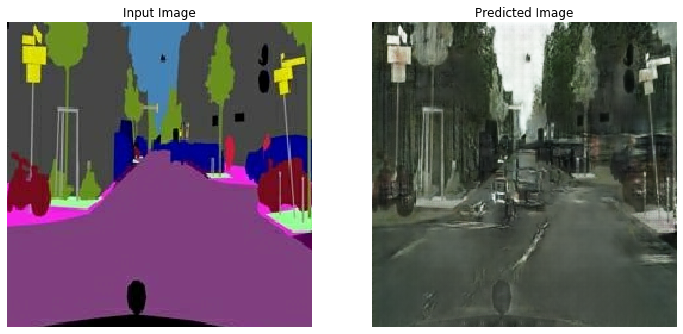

Time taken for epoch 14 is 998.2187173366547 sec


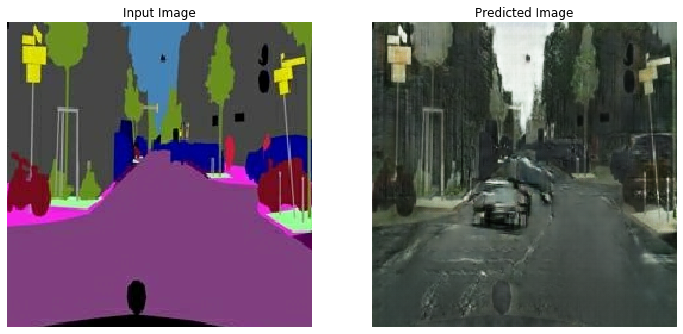

Saving checkpoint for epoch 15 at ./checkpoints_cyclegan/train/ckpt-3
Time taken for epoch 15 is 999.8117492198944 sec


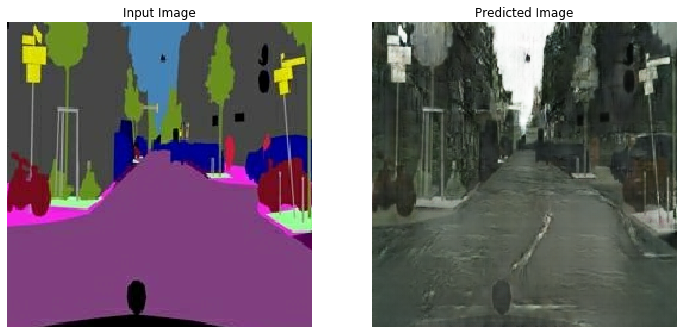

Time taken for epoch 16 is 998.3481760025024 sec


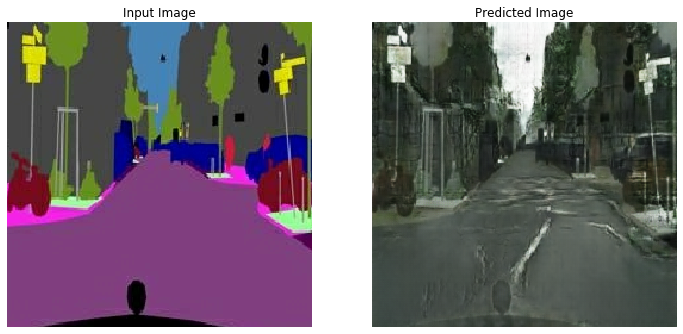

Time taken for epoch 17 is 998.2193419933319 sec


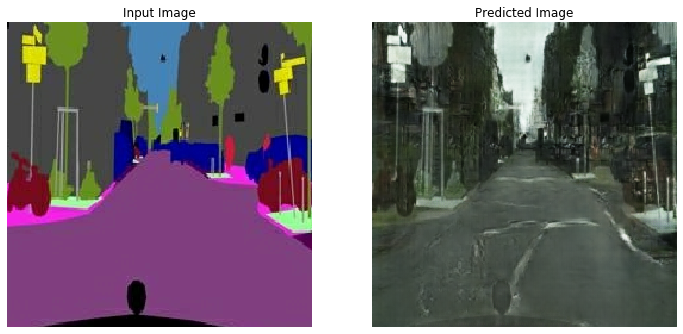

Time taken for epoch 18 is 998.8479602336884 sec


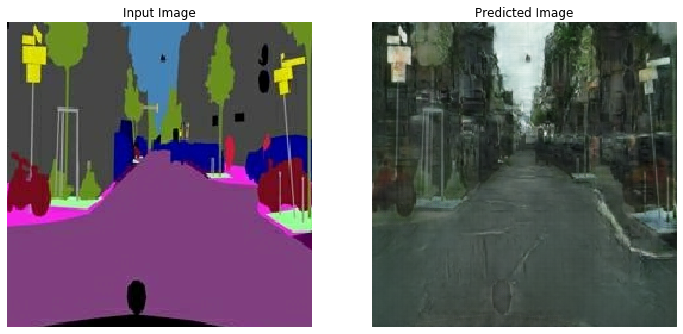

Time taken for epoch 19 is 998.1496646404266 sec


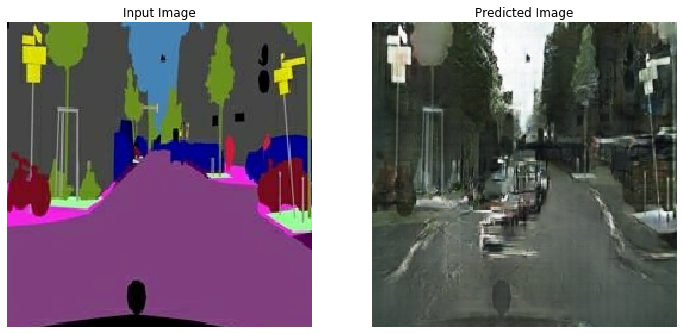

Saving checkpoint for epoch 20 at ./checkpoints_cyclegan/train/ckpt-4
Time taken for epoch 20 is 999.8308999538422 sec


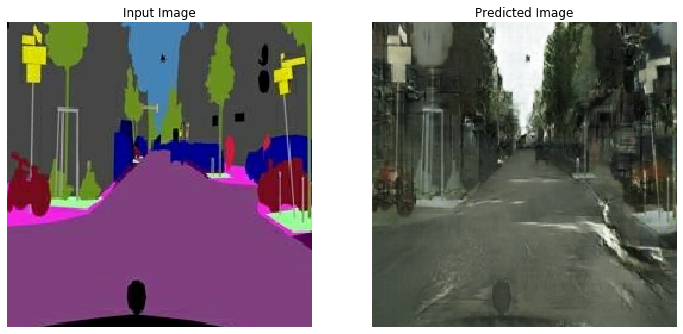

Time taken for epoch 21 is 995.3322215080261 sec


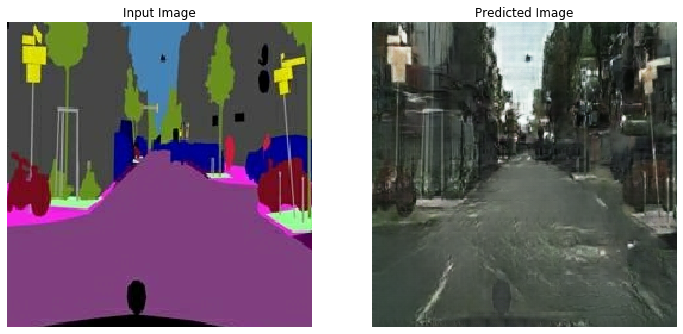

Time taken for epoch 22 is 995.9766309261322 sec


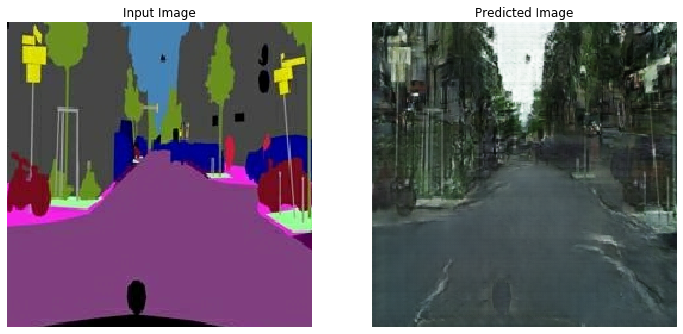

Time taken for epoch 23 is 995.7706379890442 sec


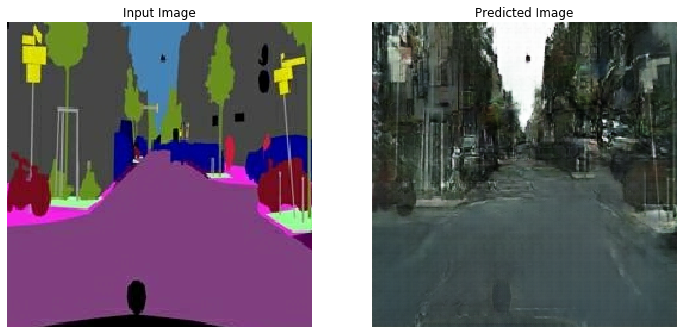

Time taken for epoch 24 is 995.3713614940643 sec


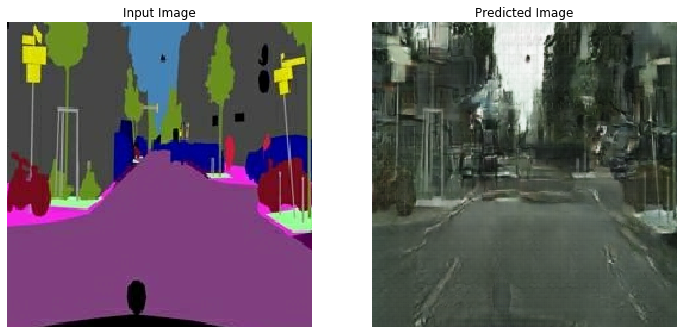

Saving checkpoint for epoch 25 at ./checkpoints_cyclegan/train/ckpt-5
Time taken for epoch 25 is 997.3476202487946 sec


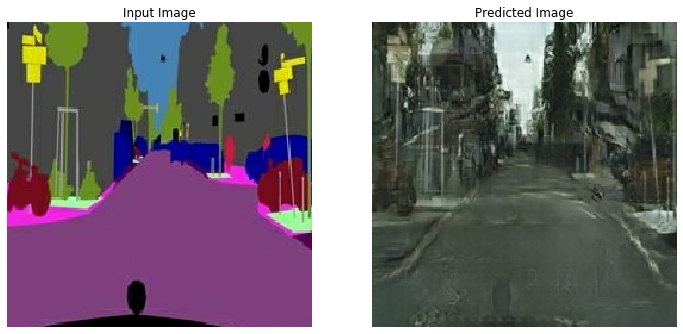

Time taken for epoch 26 is 995.7079181671143 sec


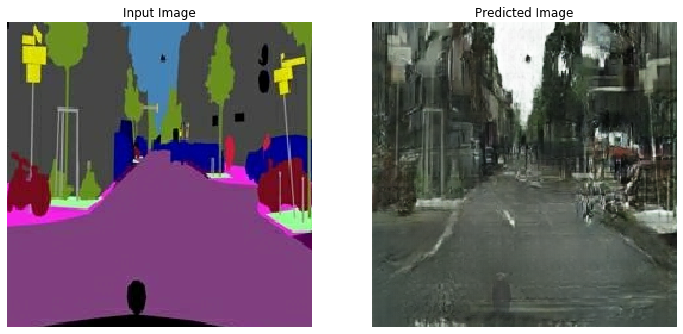

Time taken for epoch 27 is 995.936380147934 sec


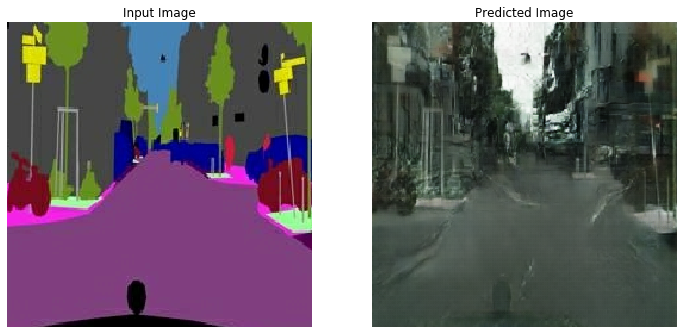

Time taken for epoch 28 is 995.2144219875336 sec


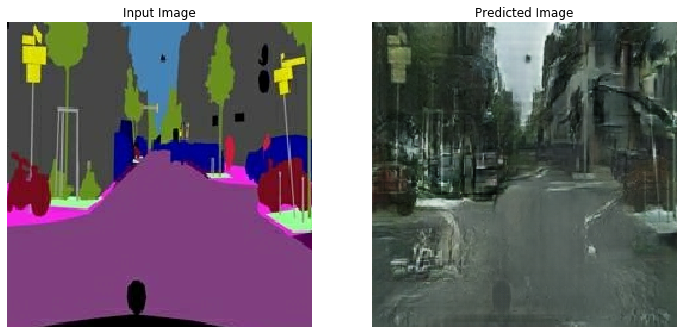

Time taken for epoch 29 is 995.8811626434326 sec


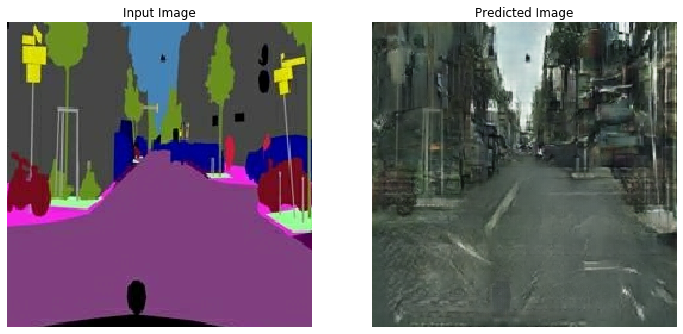

Saving checkpoint for epoch 30 at ./checkpoints_cyclegan/train/ckpt-6
Time taken for epoch 30 is 997.1026430130005 sec



In [54]:
for epoch in range(EPOCHS):
  start = time.time()

  n = 0
  for image_x, image_y in tf.data.Dataset.zip((train_masks, train_reals)):
    train_step(image_x, image_y)
    if n % 100 == 0:
      print ('=', end='')
    n+=1

#   clear_output(wait=True)
  # Using a consistent image (sample_horse) so that the progress of the model
  # is clearly visible.
  generate_images(generator_g, sample_mask)

  if (epoch + 1) % 5 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))

In [55]:
!ls {checkpoint_dir}

ls: cannot access '{checkpoint_dir}': No such file or directory


## Generate using test dataset

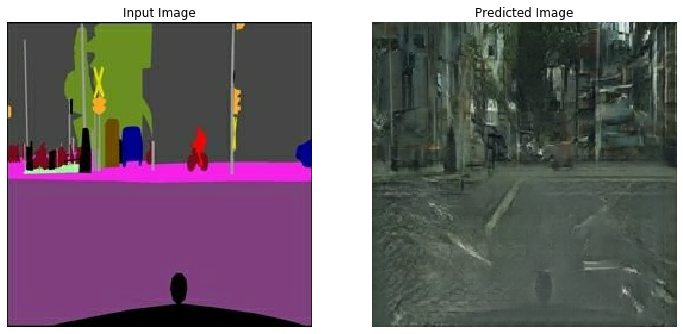

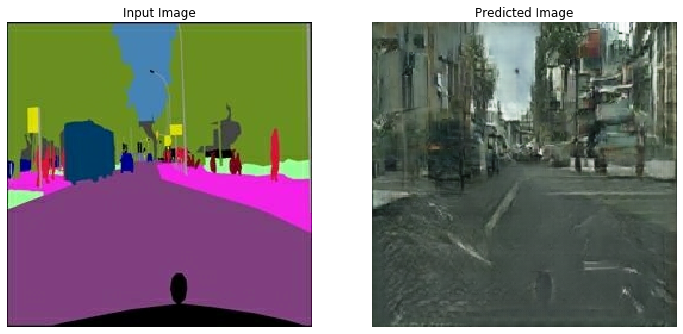

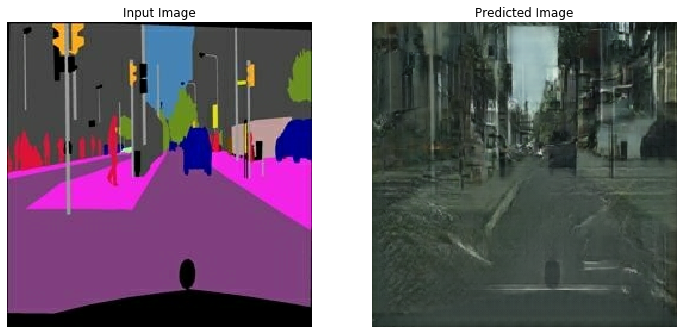

CPU times: user 832 ms, sys: 15.8 ms, total: 848 ms
Wall time: 766 ms


In [42]:
%%time
# Run the trained model on the test dataset
for inp in test_masks.take(3):
  generate_images(generator_g, inp)

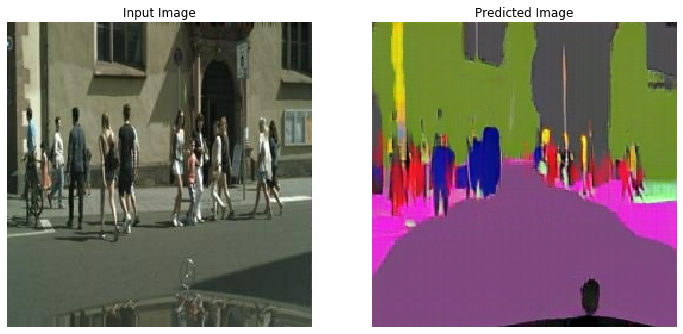

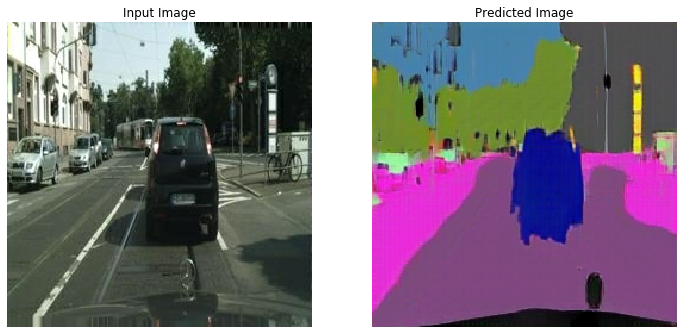

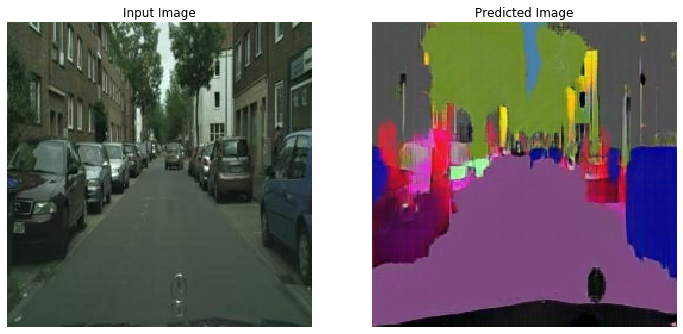

CPU times: user 911 ms, sys: 14.1 ms, total: 925 ms
Wall time: 827 ms


In [41]:
%%time
# Run the trained model on the test dataset
for inp in test_reals.take(3):
  generate_images(generator_f, inp)

## Training Generator G in a paired setting

In [51]:
def load_pair(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  real_image = image[:, :w, :]
  input_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)
  
  input_image = tf.image.resize(input_image, [IMG_HEIGHT, IMG_WIDTH],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [IMG_HEIGHT, IMG_WIDTH],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

def load_pair_train(image_file):
  input_image, real_image = load_pair(image_file)
  return preprocess_image_train(input_image), preprocess_image_train(real_image)

def load_pair_test(image_file):
  input_image, real_image = load_pair(image_file)
  return preprocess_image_test(input_image), preprocess_image_test(real_image)

In [54]:
train_dataset = tf.data.Dataset.list_files(PATH+'train/*.jpg')
train_dataset = train_dataset.map(load_pair_train,
                                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.cache().shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(1)
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

test_dataset = tf.data.Dataset.list_files(PATH+'test/*.jpg')
test_dataset = test_dataset.map(load_pair_test)
test_dataset = test_dataset.batch(1)

In [56]:
def generate_image_pairs(model, test_input, tar):
  # the training=True is intentional here since
  # we want the batch statistics while running the model
  # on the test dataset. If we use training=False, we will get
  # the accumulated statistics learned from the training dataset
  # (which we don't want)
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

## Supervised Losses

In [156]:
SUP_LAMBDA = 10

def supervised_discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_obj(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_obj(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

def supervised_generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_obj(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (SUP_LAMBDA * l1_loss)

  return total_gen_loss

## Loading from last cyclegan iteration

In [143]:
unsupervised_ckpt_manager.checkpoints

['./checkpoints_cyclegan/train/ckpt-1',
 './checkpoints_cyclegan/train/ckpt-2',
 './checkpoints_cyclegan/train/ckpt-3',
 './checkpoints_cyclegan/train/ckpt-4',
 './checkpoints_cyclegan/train/ckpt-5',
 './checkpoints_cyclegan/train/ckpt-6']

In [157]:
# if a checkpoint exists, restore the latest checkpoint.
ckpt_number = -2
if unsupervised_ckpt_manager.latest_checkpoint:
    print("Found:", unsupervised_ckpt_manager.checkpoints[ckpt_number])
    unsupervised_ckpt.restore(unsupervised_ckpt_manager.checkpoints[ckpt_number])
    print ('Checkpoint {} restored!'.format(len(unsupervised_ckpt_manager.checkpoints)+ckpt_number+1))

Found: ./checkpoints_cyclegan/train/ckpt-5
Checkpoint 5 restored!


In [158]:
supervised_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
supervised_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# supervised_generator_optimizer = generator_g_optimizer
# supervised_discriminator_optimizer = discriminator_y_optimizer

In [159]:
@tf.function
def supervised_train_step(input_image, target):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator_g(input_image, training=True)

    disc_real_output = discriminator_y([input_image, target], training=True)
    disc_generated_output = discriminator_y([input_image, gen_output], training=True)
    
    gen_loss = supervised_generator_loss(disc_generated_output, gen_output, target)
    disc_loss = supervised_discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_loss,
                                          generator_g.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator_y.trainable_variables)

  supervised_generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator_g.trainable_variables))
  supervised_discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator_y.trainable_variables))

                              ---------- Initial Performance ----------


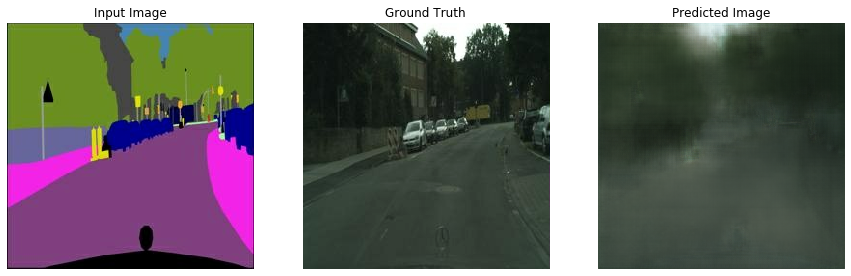

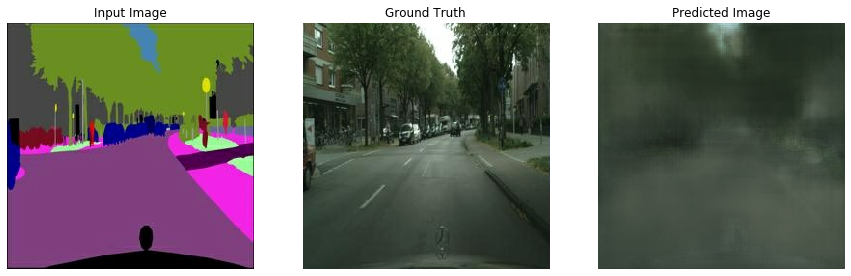

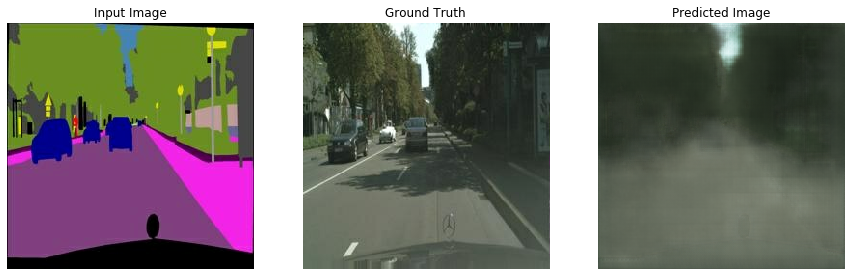

<Figure size 432x288 with 0 Axes>

In [168]:
print(" "*30 + "---------- Initial Performance ----------")
# TODO: Add a subplot to combine all three images
for example_input, example_target in test_dataset.take(3):
    generate_image_pairs(generator_g, example_input, example_target)
# plt.savefig("mode_collapse.png")

In [162]:
EPOCHS = 10

In [163]:
def fit(train_ds, epochs, test_ds):
    
  print(" "*30 + "---------- Initial Performance ----------")
  for example_input, example_target in test_dataset.take(1):
    generate_image_pairs(generator_g, example_input, example_target)
    
  for epoch in range(epochs):
    start = time.time()

    # Train
    n_iter = 0
    for input_image, target in train_ds:
      supervised_train_step(input_image, target)
      if n_iter % 100 == 0:
        print ('=', end='')
      n_iter+=1

    generate_image_pairs(generator_g, example_input, example_target)

    # saving (checkpoint) the model every 10 epochs
#     if (epoch + 1) % 25 == 0:
#       ckpt_save_path = ckpt_manager.save()
#       checkpoint.save(file_prefix = checkpoint_prefix)
#       print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
#                                                          ckpt_save_path))
    
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))

                              ---------- Initial Performance ----------


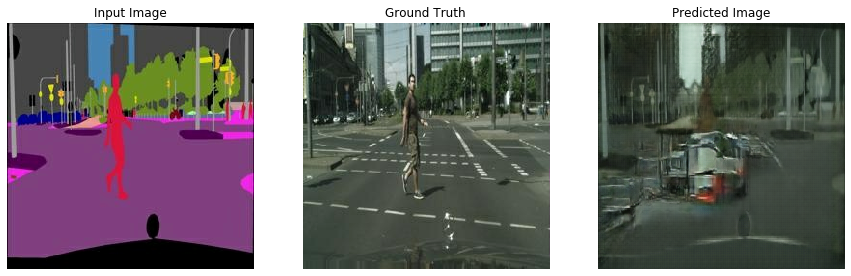

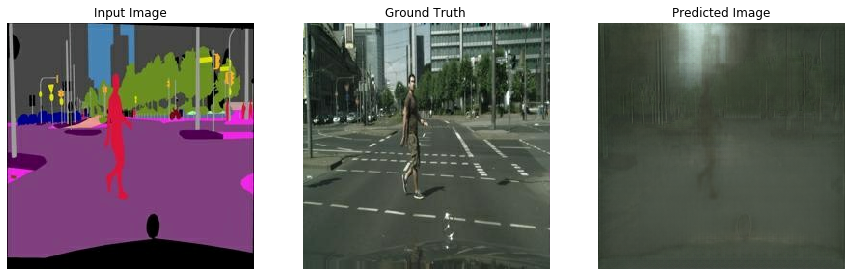

Time taken for epoch 1 is 98.06779599189758 sec


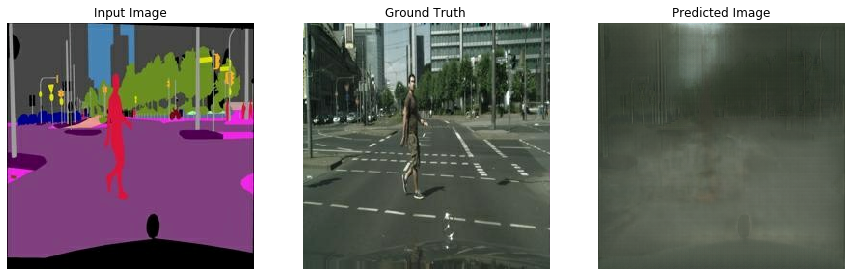

Time taken for epoch 2 is 93.76878952980042 sec


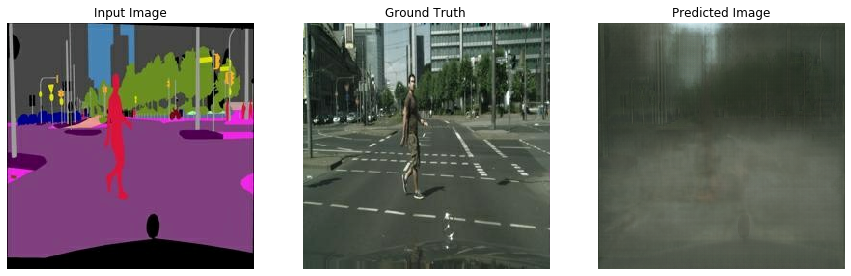

Time taken for epoch 3 is 93.82359051704407 sec


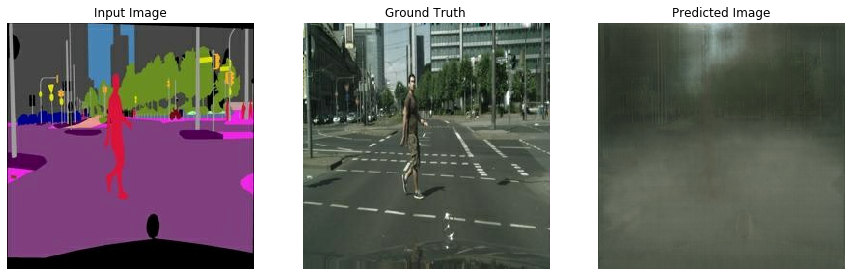

Time taken for epoch 4 is 93.79780602455139 sec


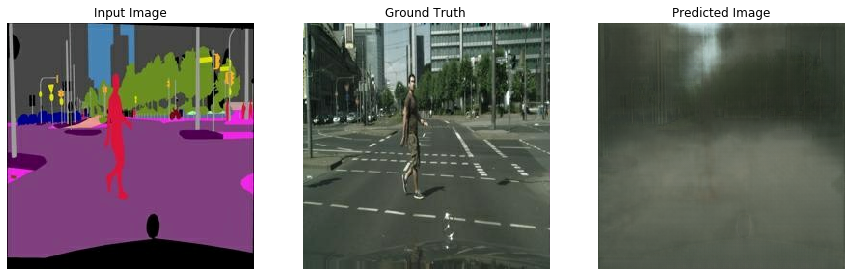

Time taken for epoch 5 is 93.7422297000885 sec


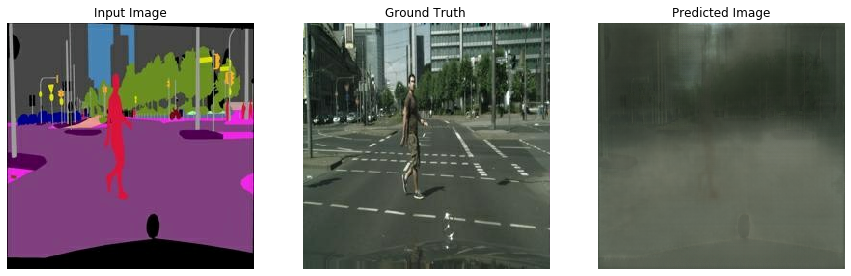

Time taken for epoch 6 is 93.84184503555298 sec


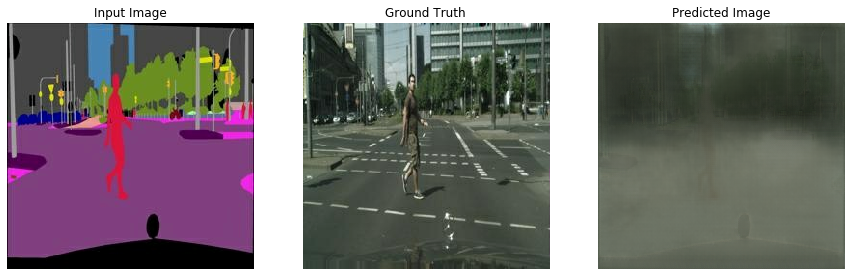

Time taken for epoch 7 is 93.7813458442688 sec


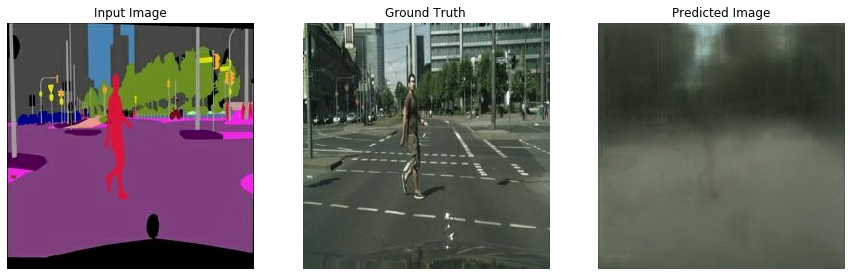

Time taken for epoch 8 is 93.81888556480408 sec


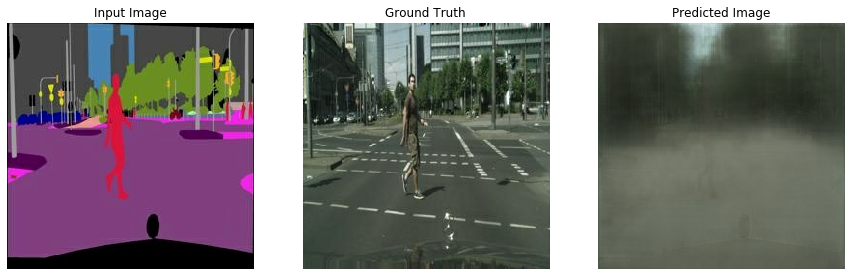

Time taken for epoch 9 is 93.75507545471191 sec


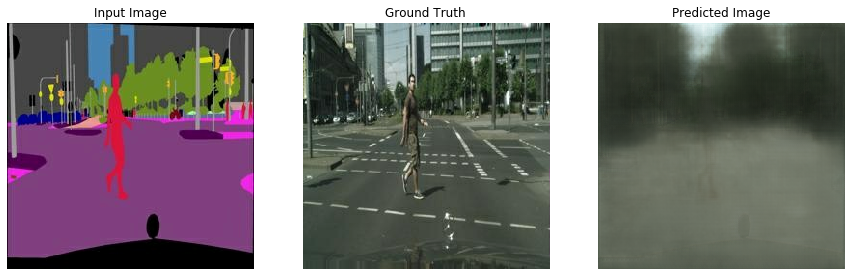

Time taken for epoch 10 is 95.74217963218689 sec

CPU times: user 5min 8s, sys: 19.5 s, total: 5min 28s
Wall time: 15min 44s


In [164]:
%%time
fit(train_dataset, EPOCHS, test_dataset)

In [165]:
checkpoint_dir = './checkpoints_cyclegan/supervised_train'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=supervised_generator_optimizer,
                                 discriminator_optimizer=supervised_discriminator_optimizer,
                                 generator=generator_g,
                                 discriminator=discriminator_y)

sup_ckpt_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=5)
# if a checkpoint exists, restore the latest checkpoint.
if sup_ckpt_manager.latest_checkpoint:
  checkpoint.restore(sup_ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

In [167]:
ckpt_save_path = ckpt_manager.save()
checkpoint.save(file_prefix = checkpoint_prefix)

# print ('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))

'./checkpoints_cyclegan/supervised_train/ckpt-2'